### Data Visualization

In [ ]:
import numpy as np
import pandas as pd
#Visualization
import plotly.express as px
import plotly.offline as pyo
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder

We start by reading the data and then we look at some basic information about it.

In [ ]:
df=pd.read_csv("preprocessed.csv")
df.shape

(6845, 17)

In [ ]:
df

,flow_duration,Header_Length,Protocol Type,Rate,urg_count,rst_count,Tot sum,Min,Max,AVG,Tot size,IAT,Variance,ratioPacketSizeToTotal,ratioTotalSizeToDuration,family,label
0,-0.245675,0.036409,-0.581913,-0.146124,-0.246885,0.096990,0.896914,2.556650,1.947607,2.545784,3.007555,-1.229292,0.279803,1.331092,-0.290519,Benign,BenignTraffic
1,-0.217959,0.558770,-0.485974,-0.152286,-0.087476,0.806597,0.822180,-0.377260,1.692497,1.824066,3.383785,-1.229292,0.739672,1.823924,-0.290531,Benign,BenignTraffic
2,-0.206885,-0.250171,-0.485974,-0.146467,0.138559,-0.047567,2.330451,-0.377260,1.947607,1.544180,1.643194,1.254592,0.969606,-0.774921,-0.290529,Benign,BenignTraffic
3,-0.195727,-0.351484,-0.485974,-0.160635,0.306143,-0.054471,-0.558902,-0.346805,-0.513828,-0.526194,-0.462549,-1.229292,0.739672,1.947328,-0.290536,Benign,BenignTraffic
4,-0.168971,1.226941,-0.485974,-0.154693,0.136515,1.583461,1.310750,-0.377260,2.993693,0.650702,3.118514,1.254630,0.969606,0.741642,-0.290533,Benign,BenignTraffic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6840,-0.185237,-0.191502,-0.485974,-0.163263,-0.163502,-0.122461,0.711640,4.455063,0.640445,2.192327,2.140888,-1.229292,-1.329739,0.928997,-0.290534,Web,Backdoor_Malware
6841,-0.190212,-0.400053,-0.102218,-0.138077,-0.295526,-0.385844,-0.313957,-0.431404,-0.297185,-0.464880,-0.473817,1.254049,0.969606,-0.868491,-0.290535,Web,SqlInjection
6842,-0.210594,-0.366383,-0.485974,-0.164383,-0.261191,-0.342121,1.441737,-0.397564,2.140832,0.811015,2.719366,1.259481,0.969606,0.333332,-0.290531,Web,BrowserHijacking
6843,-0.224421,0.097737,-0.485974,-0.158753,0.476998,0.080463,-0.242575,-0.336653,0.146787,-0.064149,0.533602,-1.229292,0.049868,2.215949,-0.290534,Web,BrowserHijacking


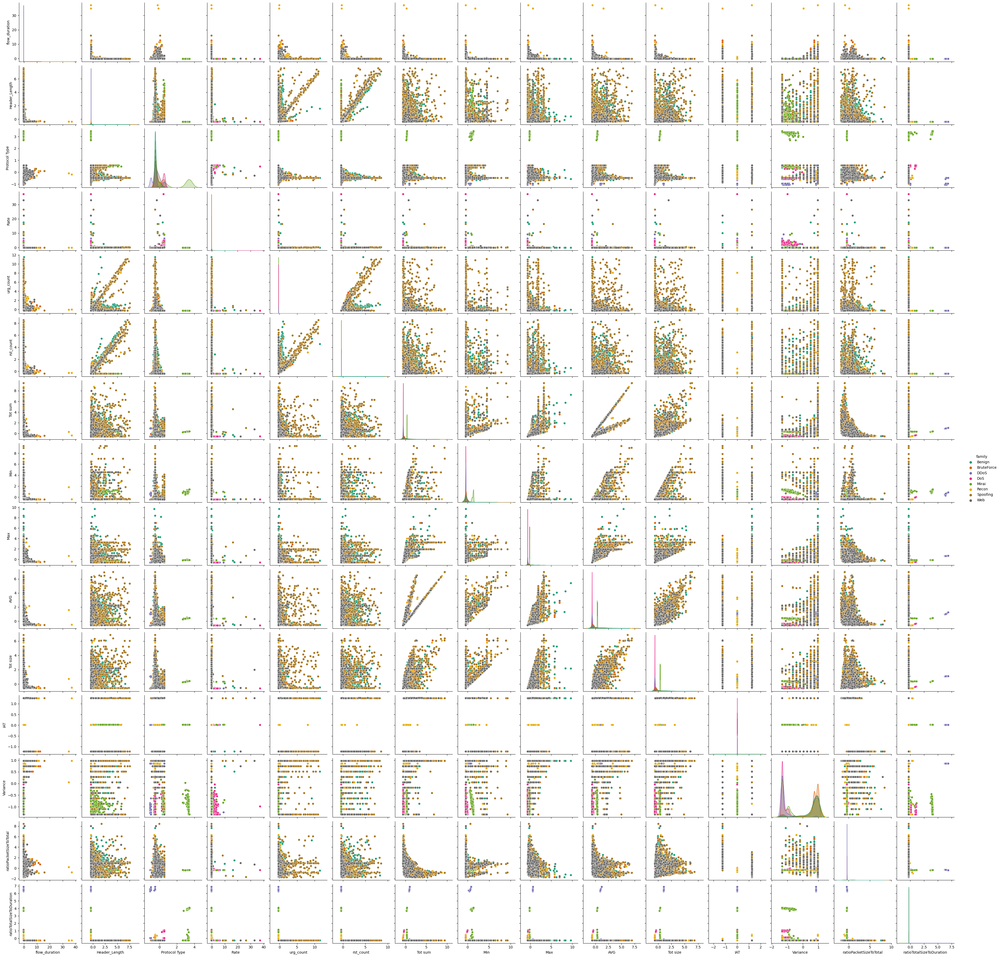

In [ ]:
import seaborn as sns
sns.pairplot(df,hue='family',palette='Dark2')

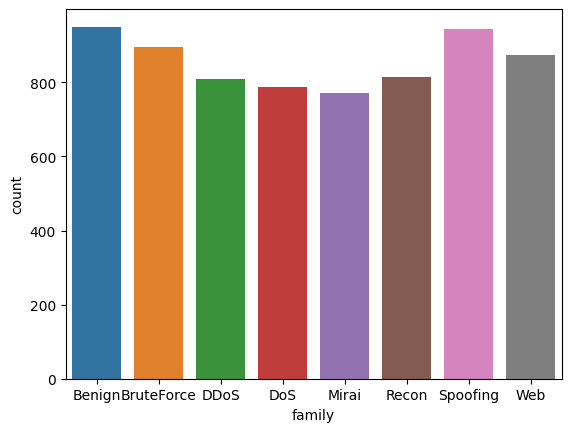

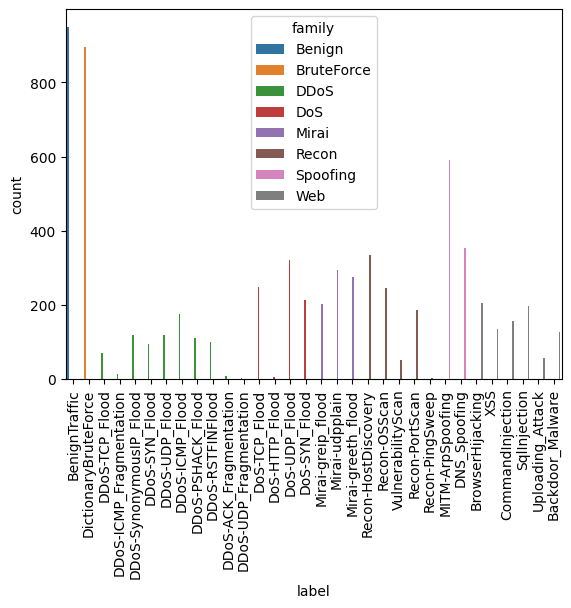

In [ ]:
sns.countplot(x='family', data=df)
plt.show()
sns.countplot(x='label', hue = "family", data=df)
plt.xticks(rotation = 90)
plt.show()

In [ ]:
# Select only the numeric columns
df_noTarget = df.select_dtypes(include=[np.number])
binary_columns = ['DNS', 'Telnet', 'SMTP', 'HTTP', 'HTTPS', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 'ARP', 'ICMP', 'IPv', 'LLC']
numeric_df = df_noTarget.drop(columns=binary_columns, errors='ignore')  # errors='ignore' allows for columns that don't exist to be skipped without raising an error


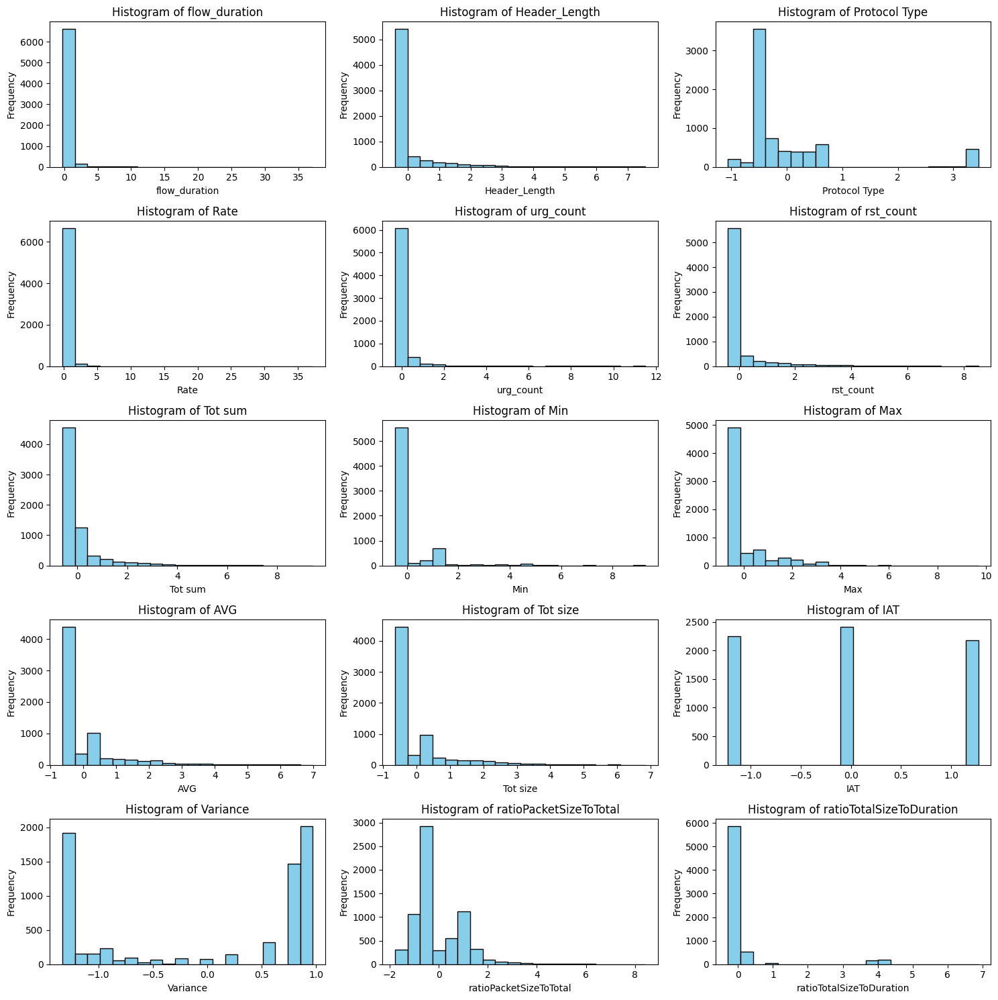

In [ ]:
n_cols = 3
n_rows = (len(numeric_df.columns) + n_cols - 1) // n_cols


fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 3 * n_rows))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Loop through the numeric columns and create a histogram for each
for ax, col in zip(axes, numeric_df.columns):
    ax.hist(numeric_df[col].dropna(), bins=20, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Hide any empty subplots that aren't needed
for ax in axes[len(numeric_df.columns):]:
    ax.set_visible(False)

# Adjust the layout so labels don't overlap
plt.tight_layout()

# Show the plot
plt.show()

## Correlations

In order to understand the correlation between the different features we look at the correlation matrix. The first matrix is too crowded as we have many features in our dataset. Thus, we define a threshold of 0.6 to be able to better visualize the matrix. We also tried just using some features.

Certain features like Tot sum, Min, Max, AVG, and Std show strong inter-correlations. These are related to packet sizes and lengths, so it's expected they would be highly correlated.

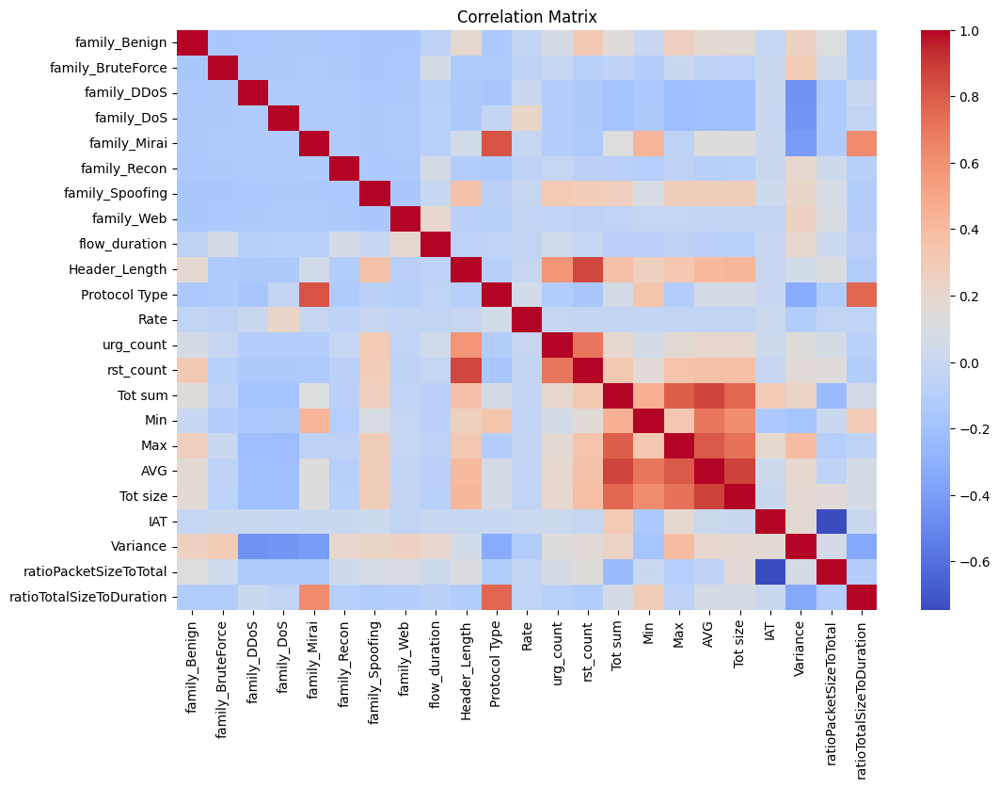

In [ ]:
# One-hot encode the 'family' column
encoder = OneHotEncoder(sparse=False)
family_encoded = encoder.fit_transform(df[['family']])
family_encoded_df = pd.DataFrame(family_encoded, columns=encoder.get_feature_names_out(['family']))

# Join the encoded df with the original df
encoded_df = pd.concat([family_encoded_df, df.drop('family', axis=1)], axis=1)

# Calculate the correlation matrix
correlation_matrix = encoded_df.corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

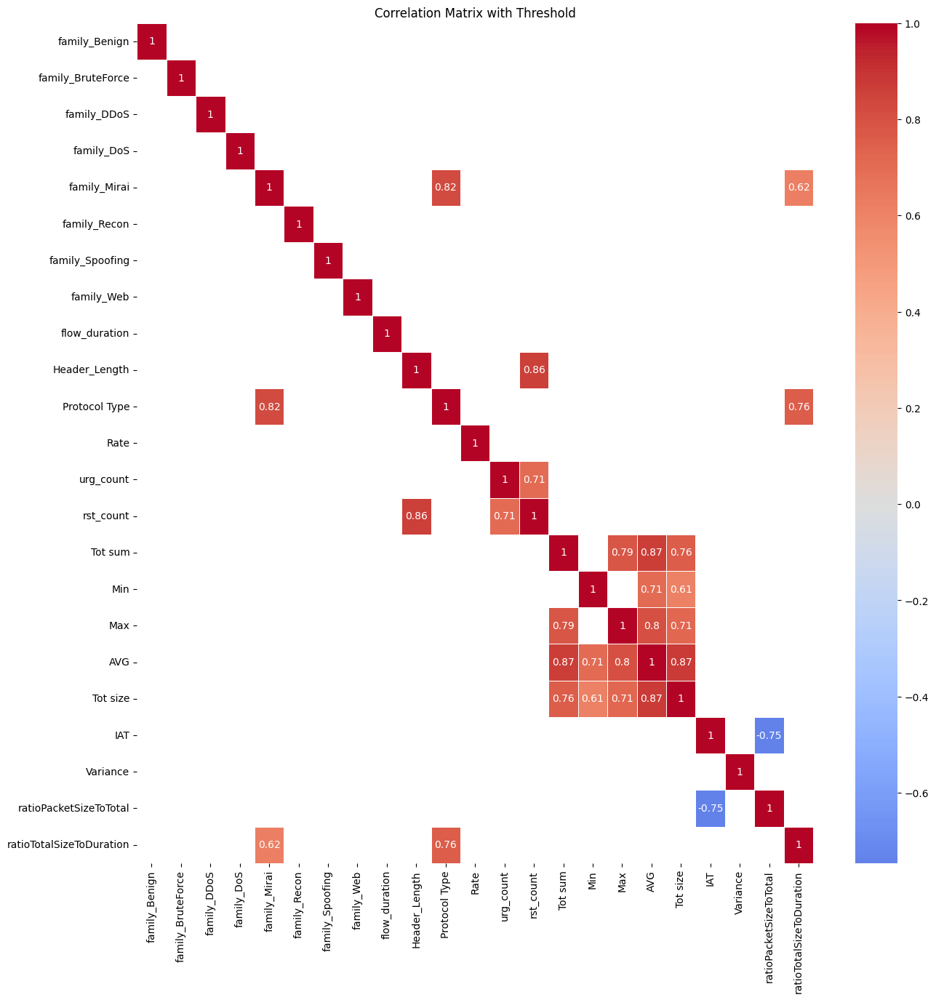

In [ ]:
# Define a threshold
threshold = 0.6

# Create a mask for values below the threshold
mask = np.abs(correlation_matrix) < threshold

# Apply the mask to the correlation matrix
filtered_corr = correlation_matrix.mask(mask)

# Create a heatmap with the masked correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(filtered_corr, cmap='coolwarm', center=0, annot=True, linewidths=.5)
plt.title('Correlation Matrix with Threshold')
plt.show()

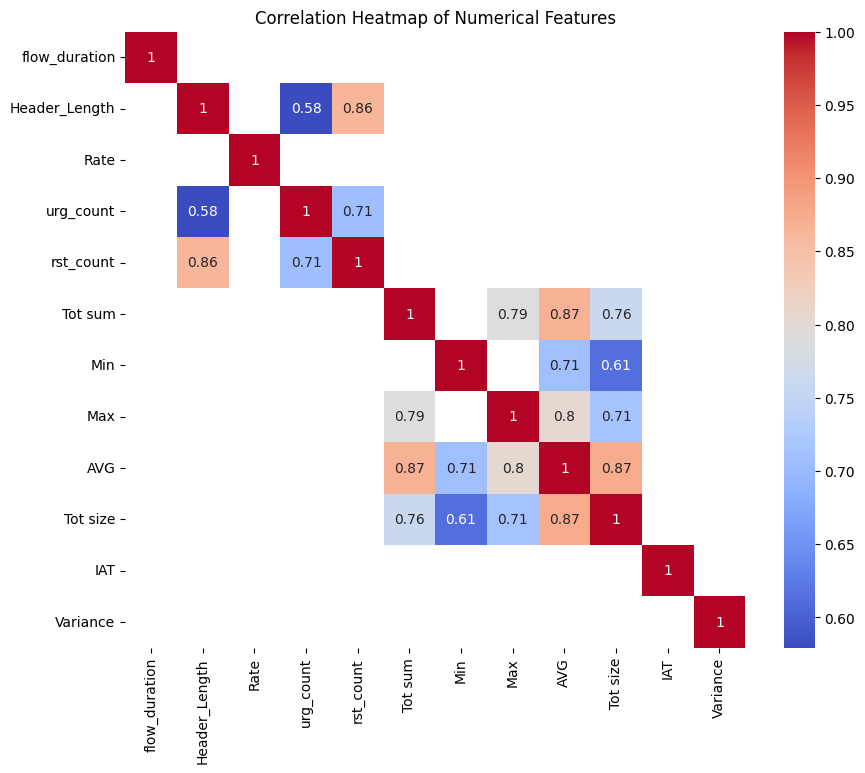

In [ ]:
numerical_features = ['flow_duration', 'Header_Length', 'Rate', 'urg_count', 'rst_count', 'Tot sum', 'Min', 'Max', 'AVG', 'Tot size', 'IAT', 'Variance']


corr = df[numerical_features].corr()

threshold = 0.5
mask = np.abs(corr) < threshold
corr_masked = corr.where(~mask, other=np.nan)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_masked, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

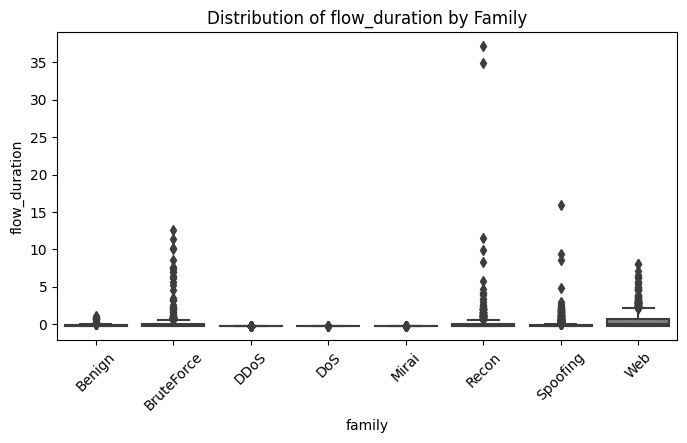

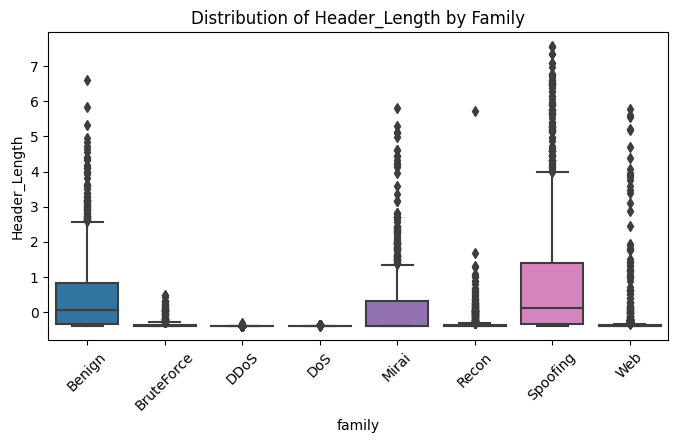

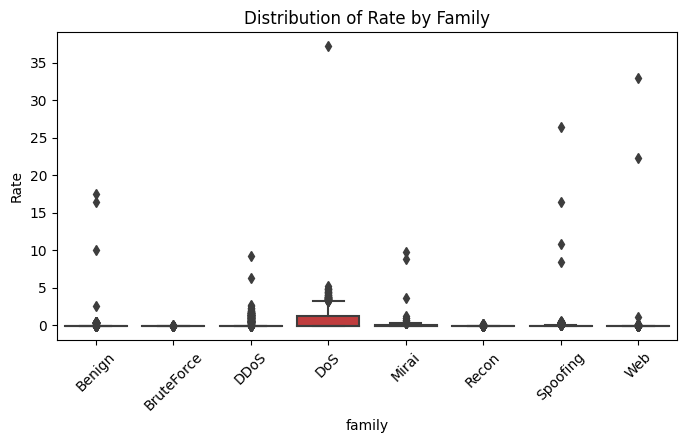

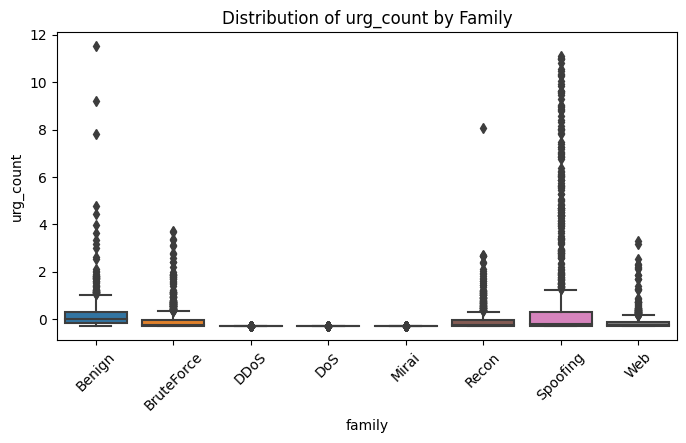

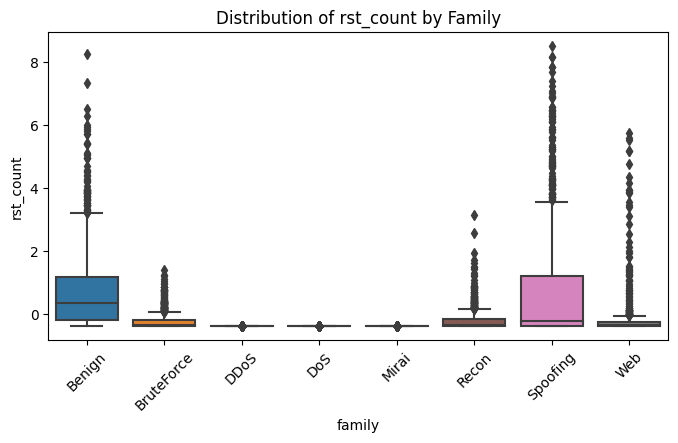

...

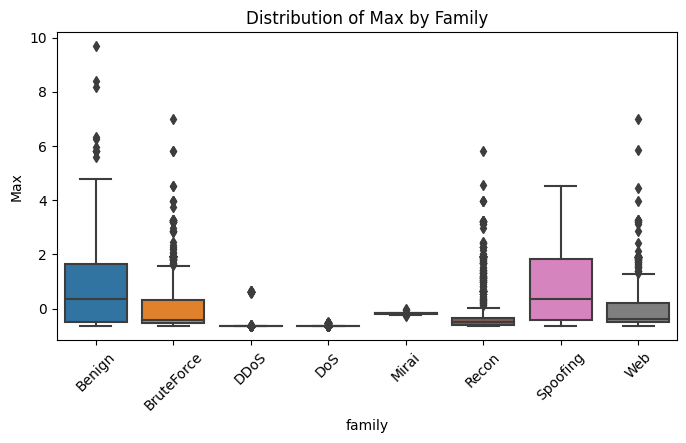

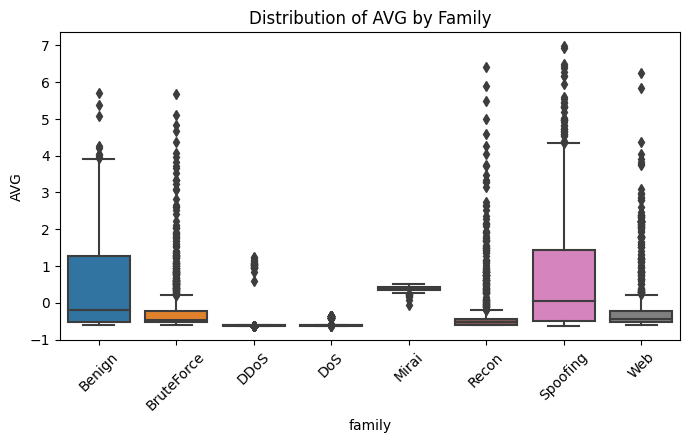

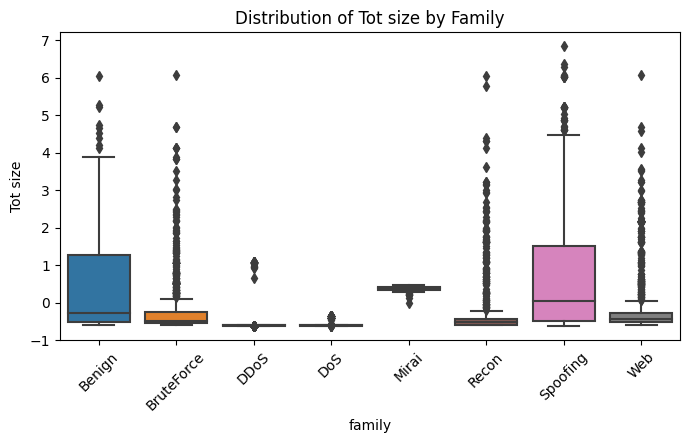

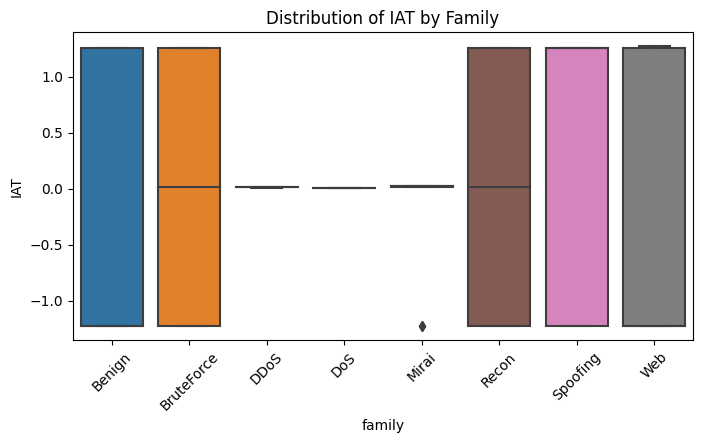

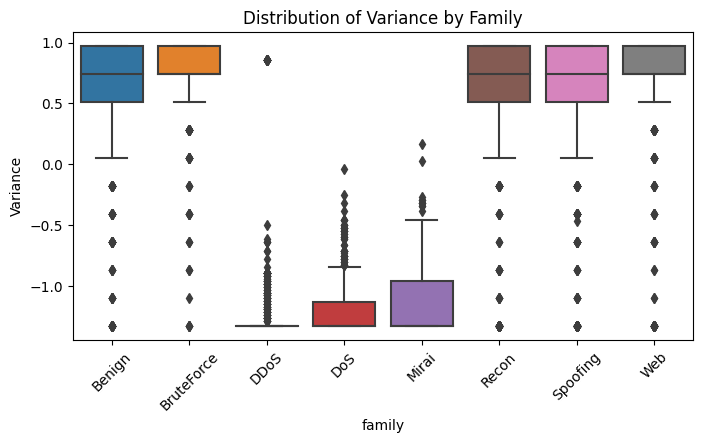

In [ ]:
numerical_features = ['flow_duration', 'Header_Length', 'Rate', 'urg_count', 'rst_count', 'Tot sum', 'Min', 'Max', 'AVG', 'Tot size', 'IAT', 'Variance']

for feature in numerical_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=df, x='family', y=feature)
    plt.title(f'Distribution of {feature} by Family')
    plt.xticks(rotation=45)
    plt.show()

### Packet size statistics

Plotting Min, Max and AVG together could reveal interesting relationships between these variables and how packet sizes vary within flows.

From the plots we can see that:

- Min vs. Max: The scatter plot between "Min" and "Max" shows a trend where as the "Min" value increases, the "Max" value also tends to increase. The distribution of points suggests a positive correlation between these two variables.

- Min vs. AVG: The "Min" vs. "AVG" scatter plot also indicates a positive correlation. As the "Min" values increase, the "AVG" values tend to increase as well. However, the spread of points is more dispersed compared to the "Min" vs. "Max" plot, suggesting that the relationship might be less strong or more variable.

-  Most data points are concentrated in the lower range for all three variables, which suggests that for most observations, the values of "Min", "Max", and "AVG" are low. There are fewer observations with high values.

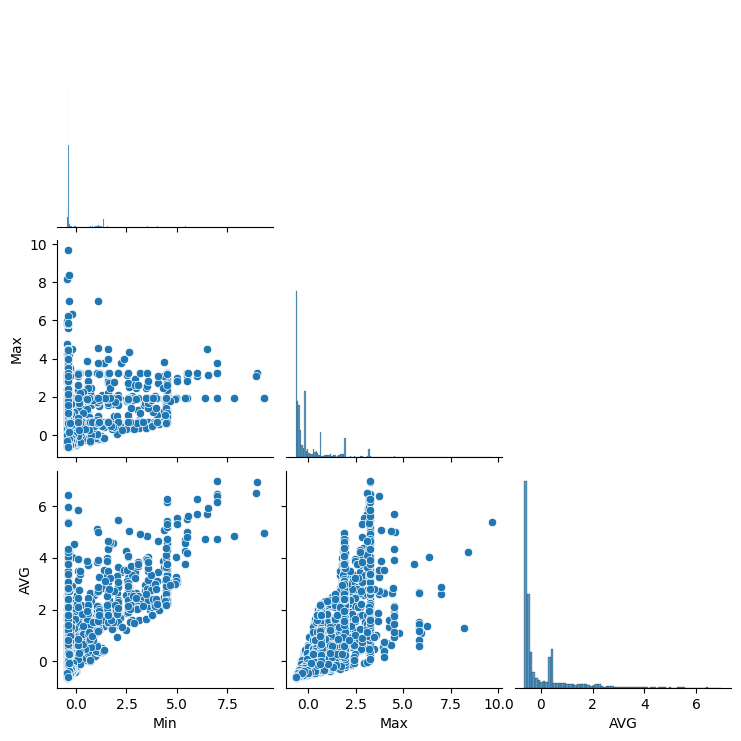

In [ ]:
packet_size_stats = ['Min', 'Max', 'AVG']
sns.pairplot(df[packet_size_stats], corner=True)

### Scatter Plot of each column by Attack Category

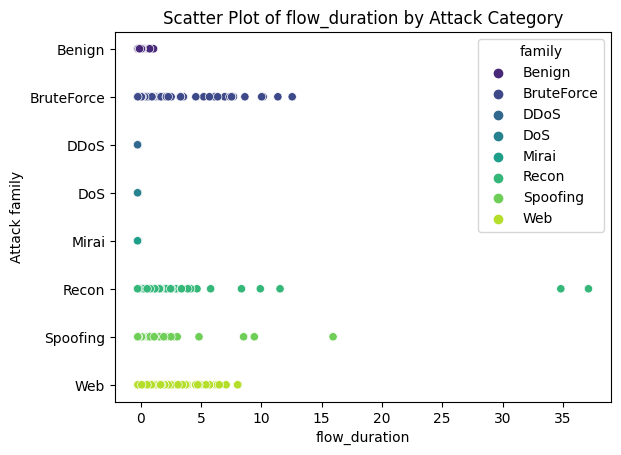

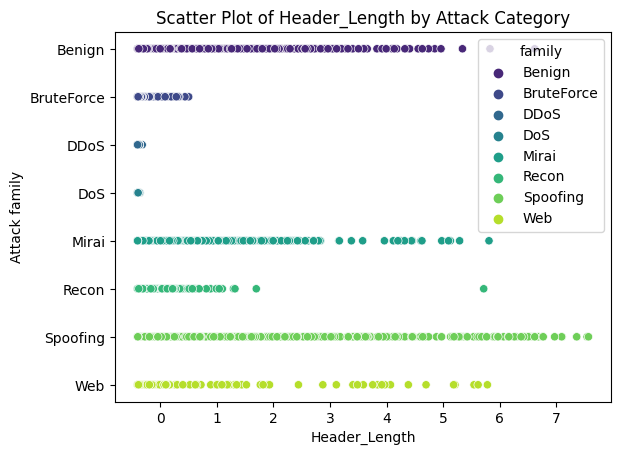

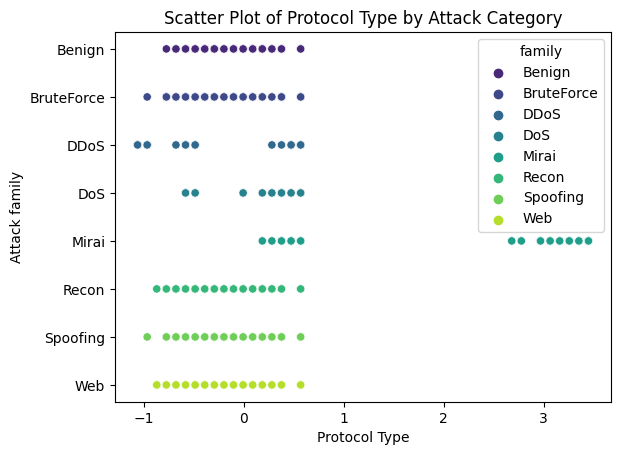

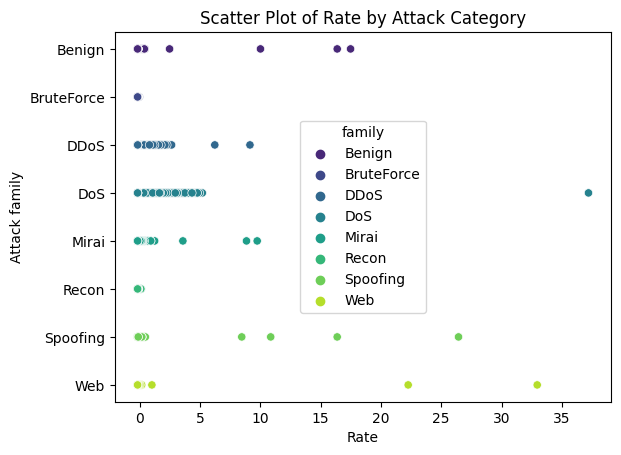

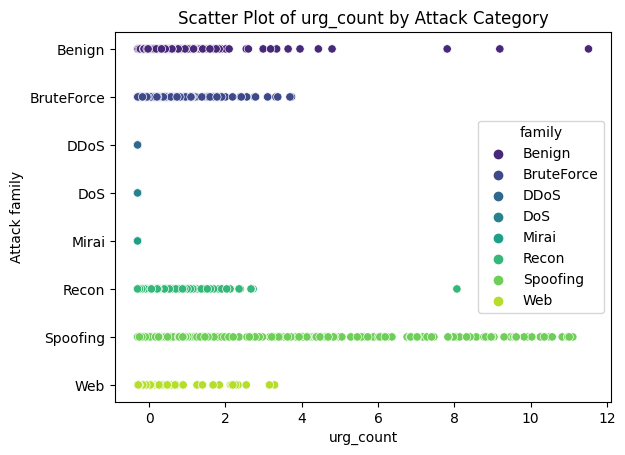

...

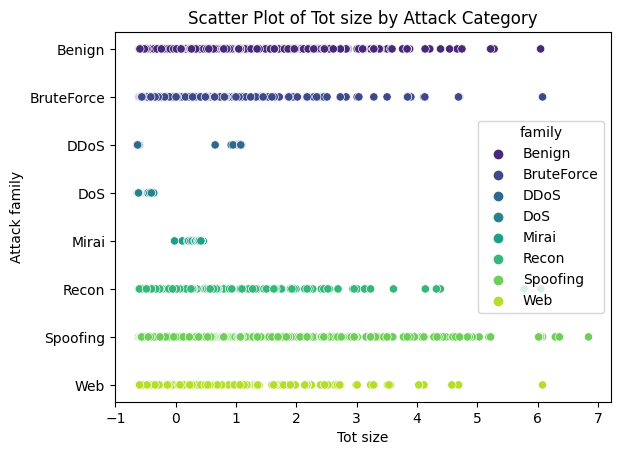

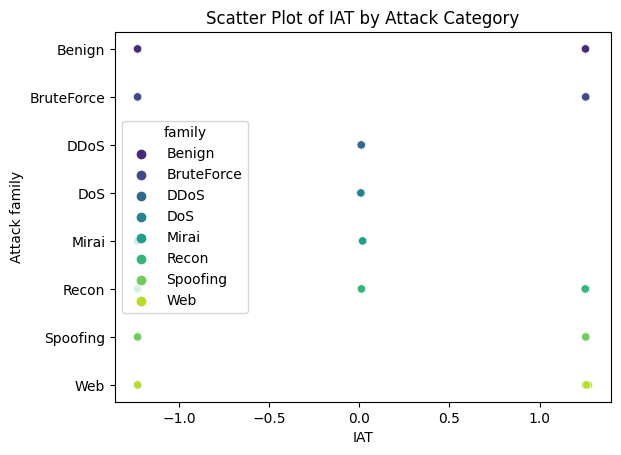

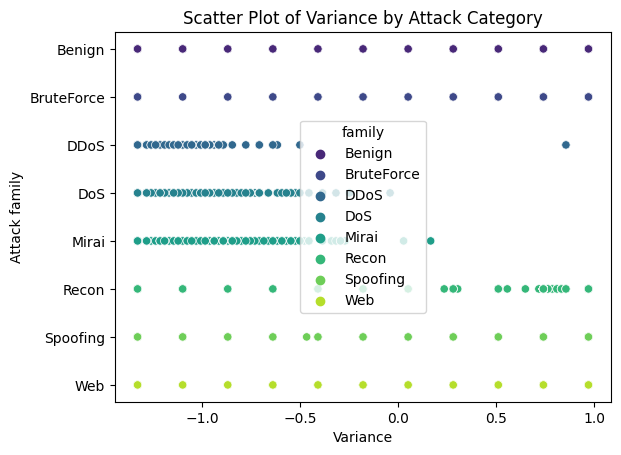

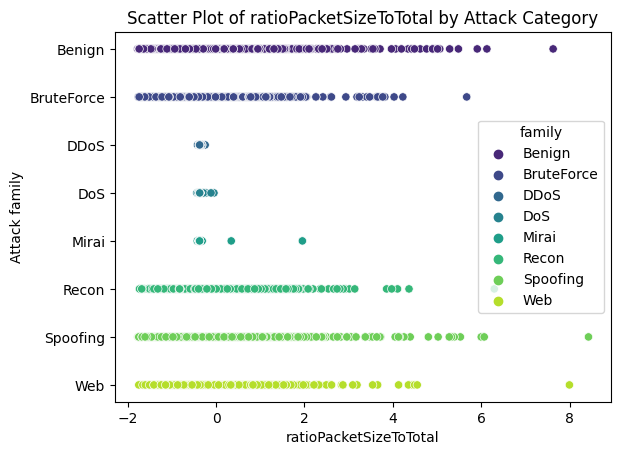

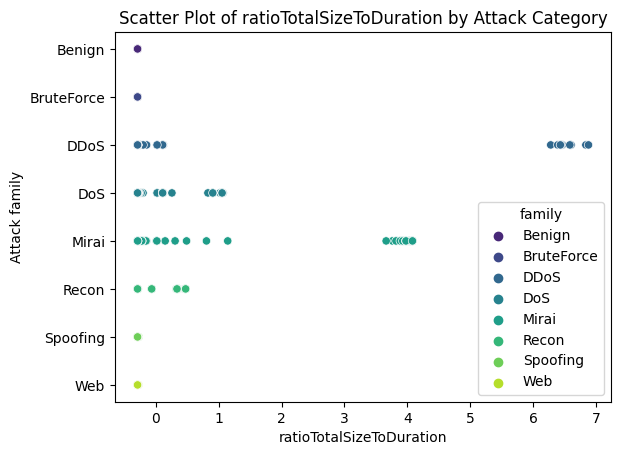

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = df.select_dtypes(include='number').columns
for column in numeric_columns:
    sns.scatterplot(x=column, y='family', hue='family', data=df, palette='viridis', legend='full')
    plt.xlabel(column)
    plt.ylabel('Attack family')
    plt.title(f'Scatter Plot of {column} by Attack Category')
    plt.show()

### Pair plots

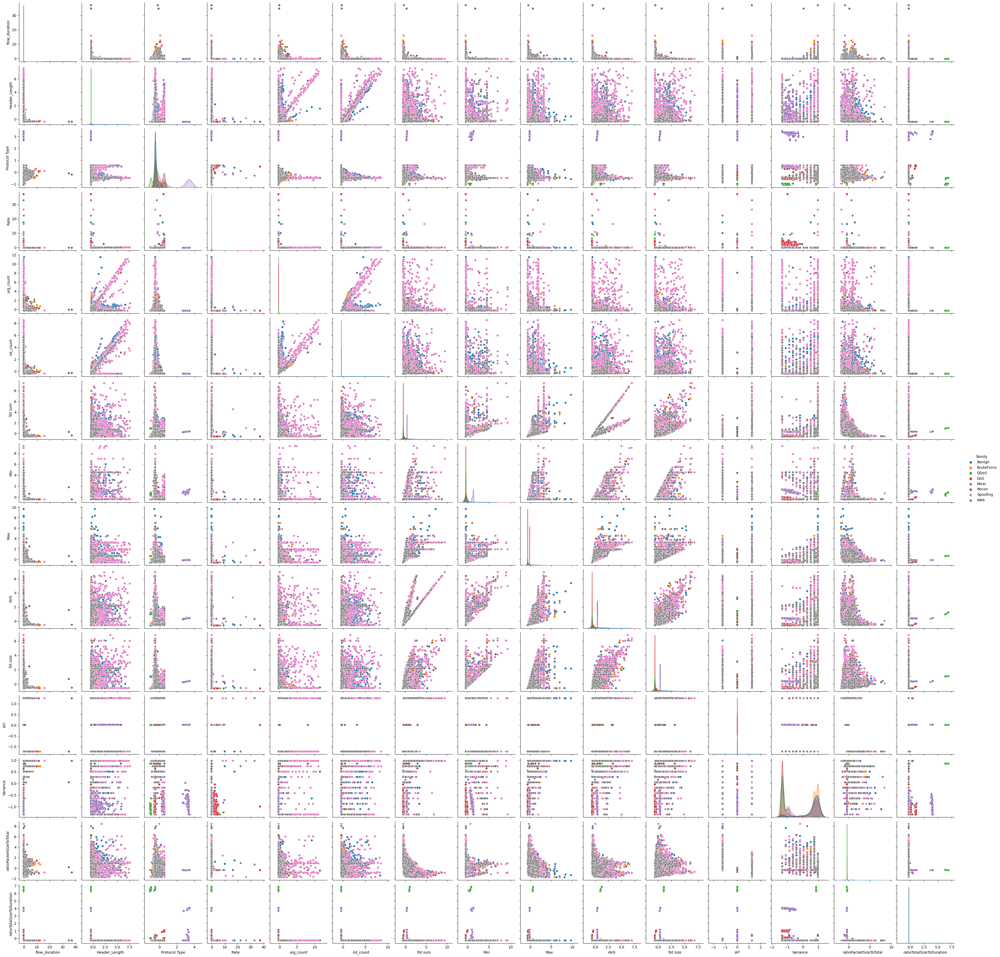

In [ ]:
sns.pairplot(df, hue='family')
plt.show()

### Rate by Family

There is a clear variation in the 'Rate' among different 'family' categories. This suggests that 'Rate' could be a significant feature to distinguish between these categories.

The 'DDoS' category has the highest mean 'Rate' and also shows a large error bar (standard deviation), indicating substantial variability within this category. The large error bar could be due to a wide range of 'Rate' values or outliers in the 'DDoS' data.

The 'Benign' category has the lowest mean 'Rate', which is expected as normal traffic typically does not have as high a rate as malicious traffic like DDoS attacks.

The close clustering of the bars for most categories except 'DDoS' suggests that 'Rate' has a relatively homogenous distribution across these categories, with 'DDoS' being an exception.

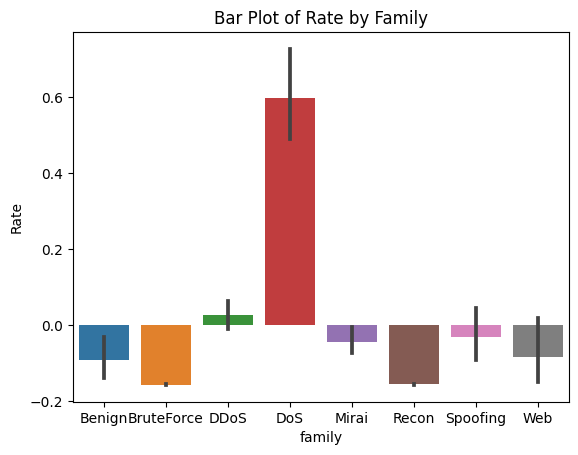

In [ ]:
sns.barplot(x='family', y='Rate', data=df)
plt.title('Bar Plot of Rate by Family')
plt.show()


### Header length by Family

The distribution of "Header_Length" across categories is not uniform, indicating that this feature could be useful in differentiating between different types of traffic or threat categories.

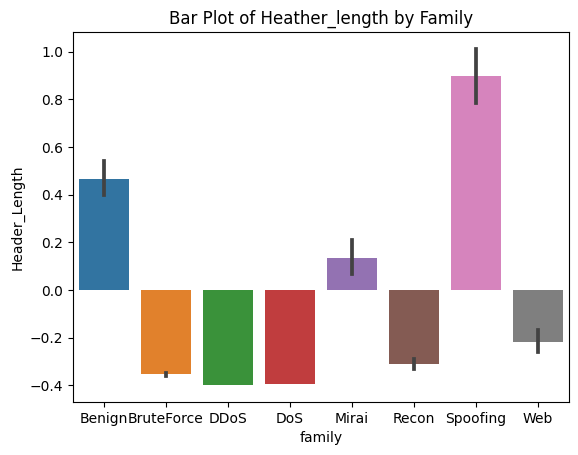

In [ ]:
sns.barplot(x='family', y='Header_Length', data=df)
plt.title('Bar Plot of Heather_length by Family')
plt.show()

### Total Size by Family

The "Mirai", "DDoS", and "Web" categories have wider distributions, indicating a larger variability in "Total Size" compared to other categories. This could suggest a higher diversity in the total sizes associated with these types of network traffic or attacks.

 It appears that the "Benign" category has a lower median "Total Size" compared to "Mirai", "Recon", and "Web". In contrast, "BruteForce", "DDoS", "DoS", and "Spoofing" have very narrow violins with less variance and lower medians, indicating that "Total Size" tends to be smaller and more consistent within these categories.

The narrowness of the violins for "BruteForce", "DDoS", "DoS", and "Spoofing" suggests that there are fewer variations in "Total Size" within these categories, and most of the data points are concentrated around similar values.

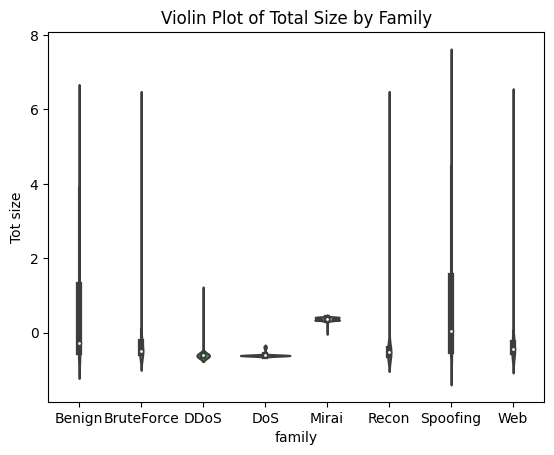

In [ ]:
sns.violinplot(x='family', y='Tot size', data=df)
plt.title('Violin Plot of Total Size by Family')
plt.show()


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=3a3c41eb-c99a-4899-842d-6de17d10af25' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>